<span style="color: #748097; font-family: times new roman; font-size: 3em;">Library Imports</span>

In [1]:
import cv2
import yaml
import json
import torch
import imageio
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from skimage.measure import label
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects
from scipy.ndimage import binary_fill_holes, binary_closing
from torchmetrics.image.fid import FrechetInceptionDistance
from utils.inference_diffusion import LatentDiffusionInference

<span style="color: #748097; font-family: times new roman; font-size: 3em;">Paths</span>

In [2]:
config_path = 'config/diffusion.yaml'
corrupted_path = 'test_samples/corrupted/sample_08_severe.nii.gz'
gt_path = 'test_samples/gt/sample_08_severe.nii.gz'
metadata_path = 'test_samples/metadata/sample_08_severe.json'
noise_mask_path = 'test_samples/noise-mask/sample_08_severe.nii.gz'

gt = nib.load(gt_path).get_fdata()
corrupted = nib.load(corrupted_path).get_fdata()
noise_mask = nib.load(noise_mask_path).get_fdata()

with open(metadata_path) as f:
    metadata = json.load(f)
slice_removal = metadata["slice_removal"]

missing_dict = {
    int(axis_name.split("_")[1]): info["indices"]
    for axis_name, info in slice_removal.items()
}

<span style="color: #748097; font-family: times new roman; font-size: 3em;">MRI Reconstruction</span>

In [3]:
with open(config_path, 'r') as f:
    config = yaml.safe_load(f)

checkpoint_path = config['inference']['checkpoint']

inference = LatentDiffusionInference(config, checkpoint_path)
result = inference.reconstruct_volume(corrupted, missing_dict, noise_mask)
reconstructed = result['reconstructed']


Loaded checkpoint from checkpoints/latent_diffusion/best_model.pth
Model moved to cuda
Inference setup complete:
  Device: cuda
  DDIM: True (steps=50)
  Mode: Patch-based
  Patch size: (64, 64, 64)
  Stride: (32, 32, 32)
  Overlap: 50% (D), 50% (H), 50% (W)
  Output dir: outputs/latent_diffusion



Reconstructing patches: 100%|██████████| 150/150 [01:22<00:00,  1.82it/s]


<span style="color: #748097; font-family: times new roman; font-size: 3em;">Post Processing</span>

In [4]:
def post_process(volume):
    volume_norm = (volume - np.min(volume)) / (np.max(volume) - np.min(volume))
    thresh = threshold_otsu(volume_norm)
    mask = volume_norm > thresh
    mask = binary_fill_holes(mask)
    mask = binary_closing(mask, iterations=2)
    mask = remove_small_objects(mask, min_size=5000)
    labeled = label(mask)
    largest_label = np.argmax(np.bincount(labeled.flat)[1:]) + 1
    mask = labeled == largest_label
    brain_only = volume * mask
    return brain_only

reconstructed = post_process(reconstructed)

<span style="color: #748097; font-family: times new roman; font-size: 3em;">Plot Resluts</span>

In [5]:
def get_slice(volume, axis, idx):
    if axis == 0:
        return volume[idx, :, :]
    elif axis == 1:
        return volume[:, idx, :]
    else:
        return volume[:, :, idx]

def safe_slice_index(idx, axis_size):
    return 0 <= idx < axis_size

def plot(gt, corr, recon, gt_missing_slice, pred_missing_slice, title, save_name=None):
    vmin = min(gt.min(), corr.min(), recon.min(), gt_missing_slice.min(), pred_missing_slice.min())
    vmax = max(gt.max(), corr.max(), recon.max(), gt_missing_slice.max(), pred_missing_slice.max())

    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    items = [
        ("Ground Truth", gt),
        ("Corrupted (Zero-filled)", corr),
        ("Reconstructed", recon),
        ("GT Missing Slice", gt_missing_slice),
        ("Missing Slice Prediction", pred_missing_slice),
    ]

    for ax, (label, img) in zip(axes, items):
        ax.imshow(img, cmap="gray", vmin=vmin, vmax=vmax)
        ax.set_title(label, fontsize=12, fontweight="bold")
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    plt.tight_layout()

    if save_name:
        plt.savefig(save_name, dpi=150, bbox_inches="tight")
        print(f"Saved: {save_name}")

    plt.show()

def plot_comparison(gt_volume, corrupted_volume, reconstructed_volume, missing_slices_dict=None, prefix="plot"):
    axis_names = {0: "axial", 1: "coronal", 2: "sagittal"}

    if missing_slices_dict is None:
        missing_slices_dict = {}

    corrupted_z = corrupted_volume.copy()

    for axis, indices in missing_slices_dict.items():
        axis_size = corrupted_z.shape[axis]
        for idx in indices:
            if not safe_slice_index(idx, axis_size):
                continue
            if axis == 0:
                corrupted_z[idx] = 0
            elif axis == 1:
                corrupted_z[:, idx] = 0
            else:
                corrupted_z[:, :, idx] = 0

    if missing_slices_dict:
        for axis, indices in missing_slices_dict.items():
            axis_size = gt_volume.shape[axis]
            for idx in indices:
                if not safe_slice_index(idx, axis_size):
                    continue

                gt_missing_slice = get_slice(gt_volume, axis, idx)
                pred_missing_slice = get_slice(reconstructed_volume, axis, idx)
                other_axes = [a for a in [0, 1, 2] if a != axis]

                for oa in other_axes:
                    mid_idx = gt_volume.shape[oa] // 2
                    gt_s = get_slice(gt_volume, oa, mid_idx)
                    c_s = get_slice(corrupted_z, oa, mid_idx)
                    r_s = get_slice(reconstructed_volume, oa, mid_idx)

                    title = (
                        f"{axis_names[axis].capitalize()} Missing Slice {idx} -- "
                        f"Showing {axis_names[oa]} mid-slice"
                    )
                    save_name = f"{prefix}_{axis_names[axis]}_{idx}_view_{axis_names[oa]}.png"

                    plot(gt_s, c_s, r_s, gt_missing_slice, pred_missing_slice, title, f'assets/{save_name}')

    else:
        D, H, W = gt_volume.shape
        mids = {"axial": D // 2, "coronal": H // 2, "sagittal": W // 2}

        for name, idx in mids.items():
            axis = ["axial", "coronal", "sagittal"].index(name)

            gt_s = get_slice(gt_volume, axis, idx)
            c_s = get_slice(corrupted_z, axis, idx)
            r_s = get_slice(reconstructed_volume, axis, idx)

            title = f"{name.capitalize()} Mid Slice ({idx})"
            save_name = f"{prefix}_{name}.png"

            plot(gt_s, c_s, r_s, r_s, r_s, title, f'assets/{save_name}')

Saved: assets/plot_coronal_63_view_axial.png


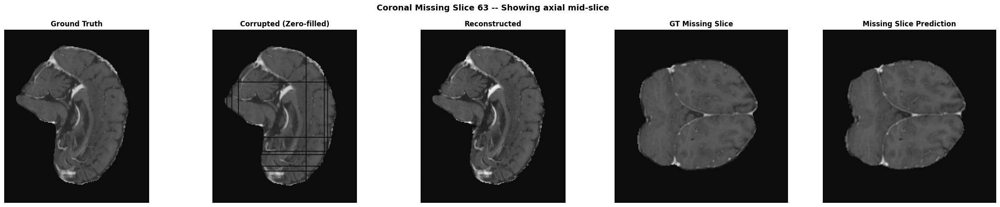

Saved: assets/plot_coronal_63_view_sagittal.png


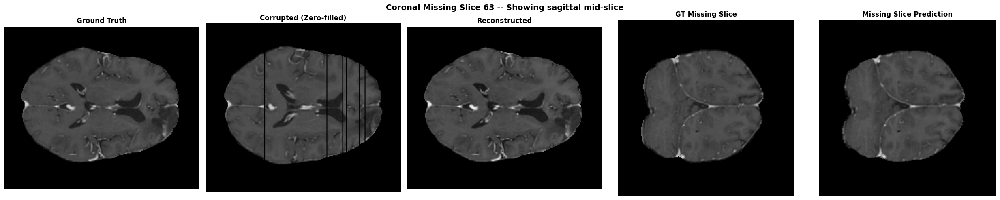

Saved: assets/plot_coronal_130_view_axial.png


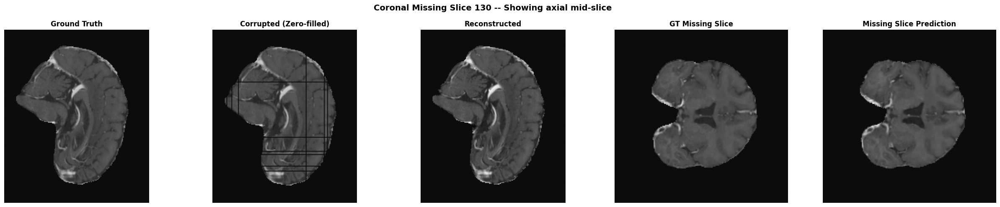

Saved: assets/plot_coronal_130_view_sagittal.png


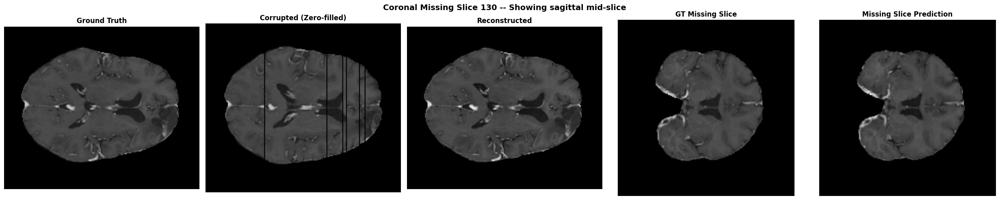

Saved: assets/plot_coronal_147_view_axial.png


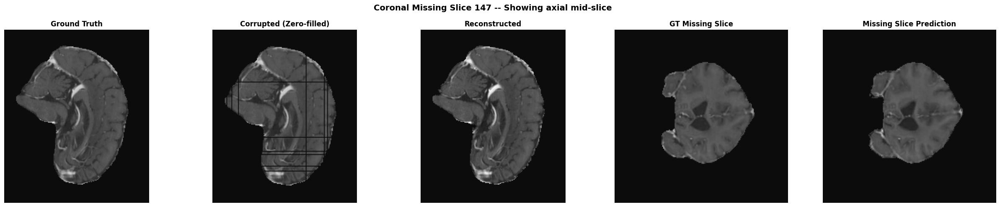

Saved: assets/plot_coronal_147_view_sagittal.png


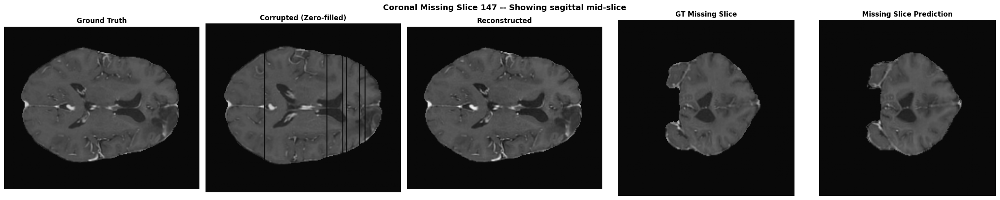

Saved: assets/plot_coronal_151_view_axial.png


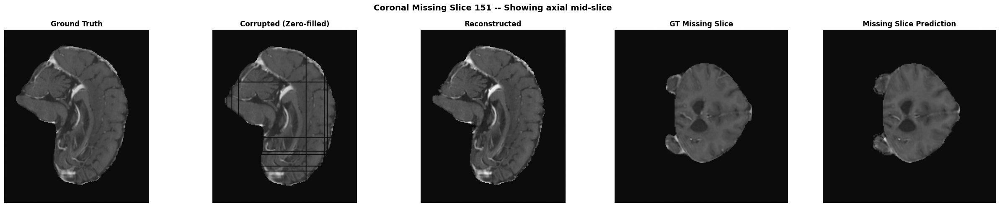

Saved: assets/plot_coronal_151_view_sagittal.png


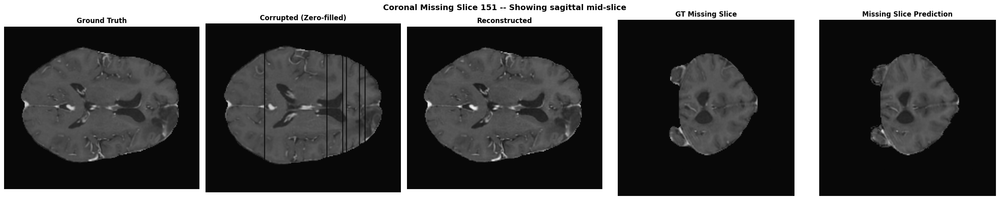

Saved: assets/plot_coronal_165_view_axial.png


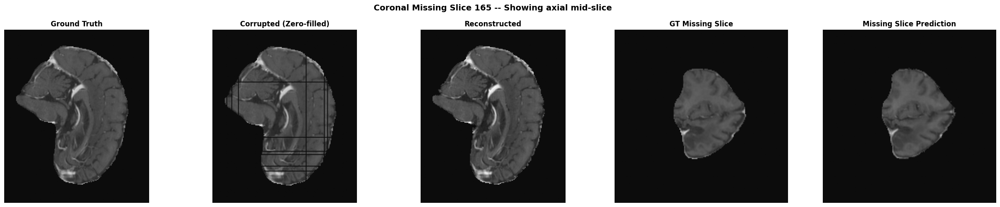

Saved: assets/plot_coronal_165_view_sagittal.png


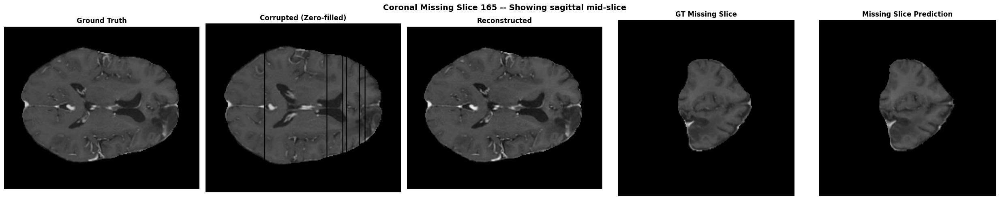

Saved: assets/plot_coronal_171_view_axial.png


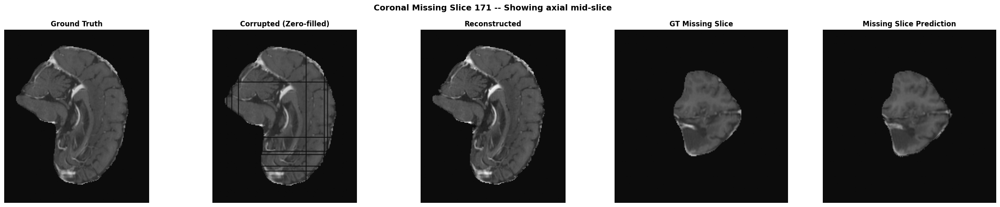

Saved: assets/plot_coronal_171_view_sagittal.png


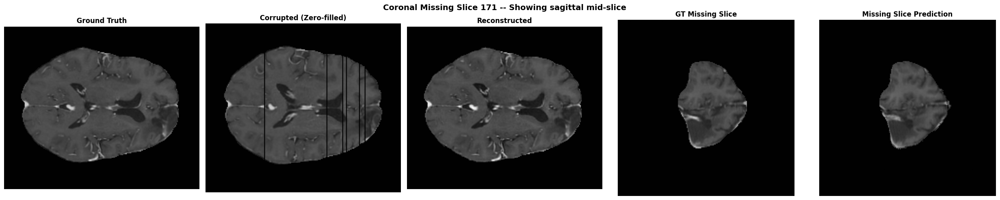

Saved: assets/plot_coronal_196_view_axial.png


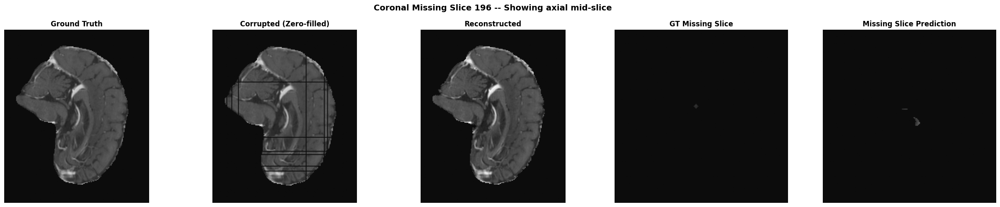

Saved: assets/plot_coronal_196_view_sagittal.png


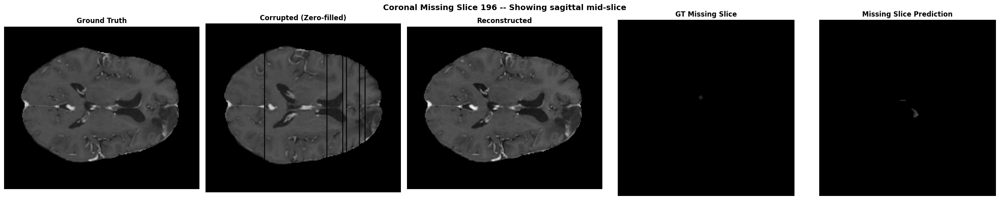

Saved: assets/plot_coronal_207_view_axial.png


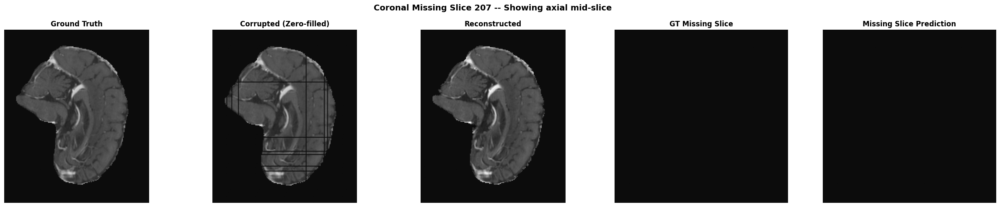

Saved: assets/plot_coronal_207_view_sagittal.png


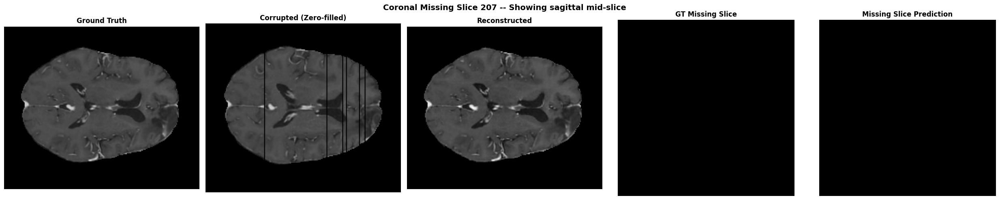

Saved: assets/plot_sagittal_17_view_axial.png


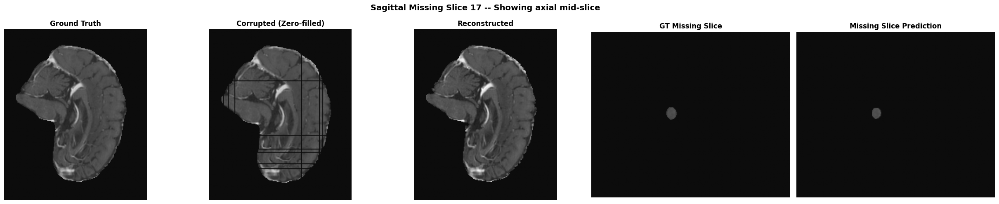

Saved: assets/plot_sagittal_17_view_coronal.png


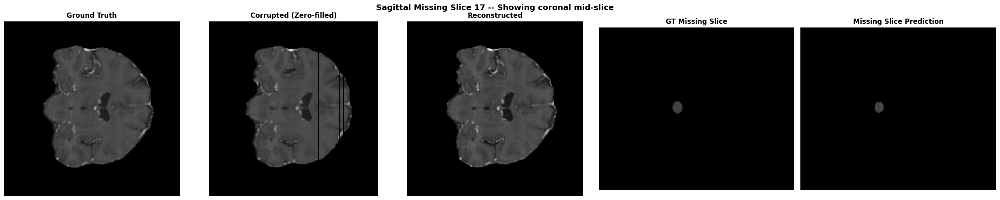

Saved: assets/plot_sagittal_23_view_axial.png


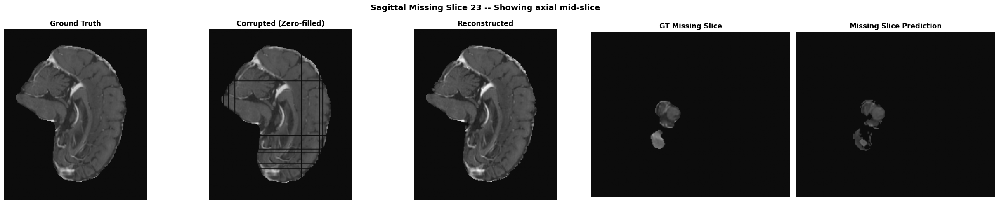

Saved: assets/plot_sagittal_23_view_coronal.png


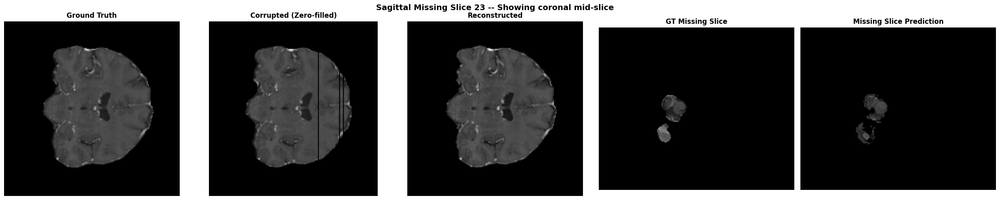

Saved: assets/plot_sagittal_31_view_axial.png


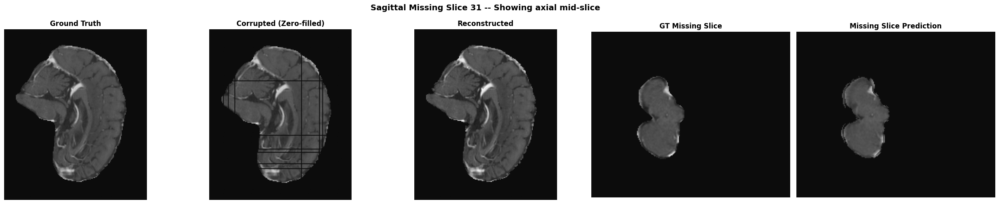

Saved: assets/plot_sagittal_31_view_coronal.png


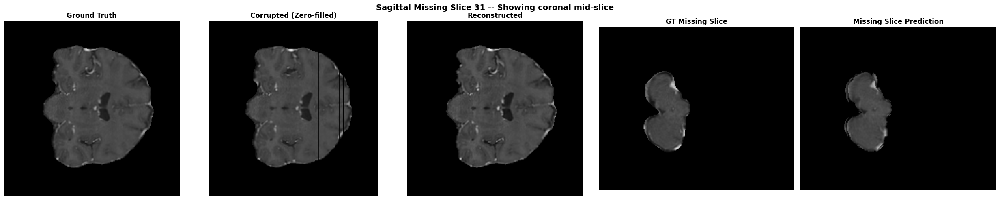

Saved: assets/plot_sagittal_113_view_axial.png


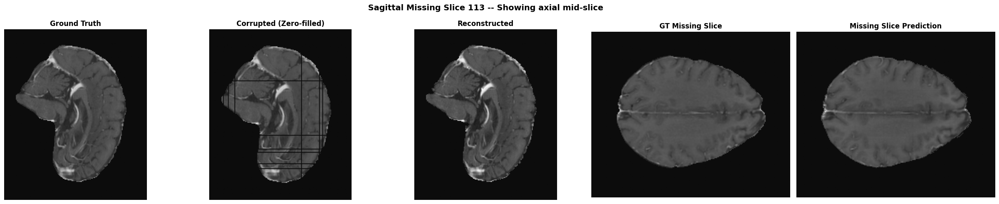

Saved: assets/plot_sagittal_113_view_coronal.png


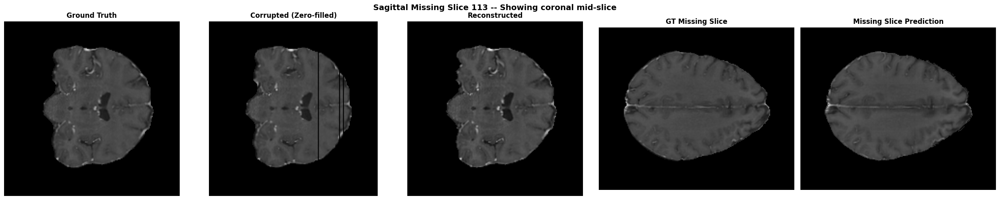

Saved: assets/plot_sagittal_135_view_axial.png


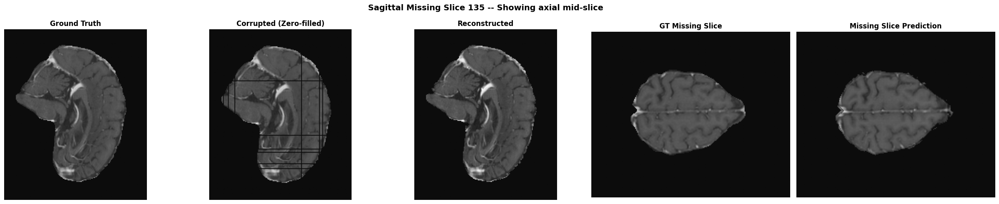

Saved: assets/plot_sagittal_135_view_coronal.png


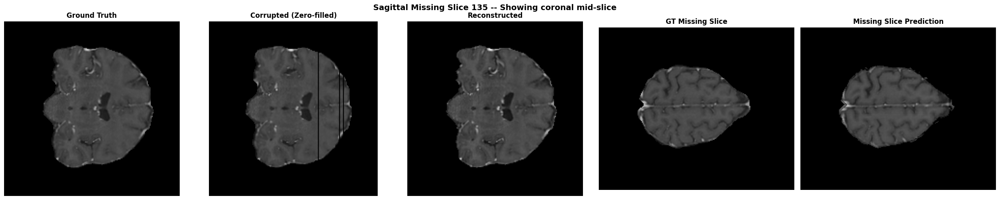

Saved: assets/plot_sagittal_139_view_axial.png


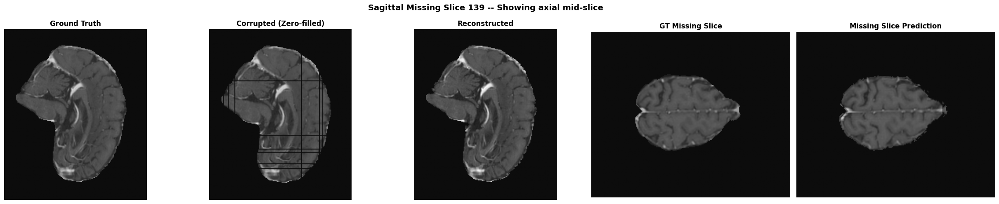

Saved: assets/plot_sagittal_139_view_coronal.png


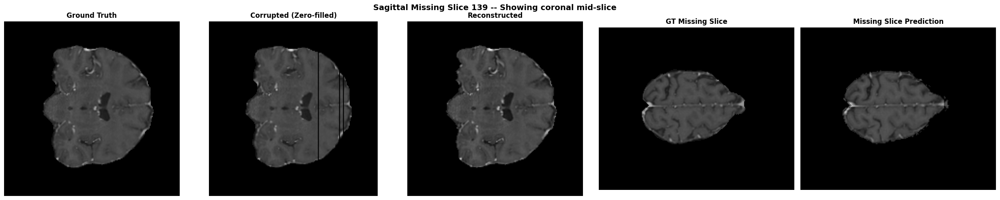

Saved: assets/plot_sagittal_175_view_axial.png


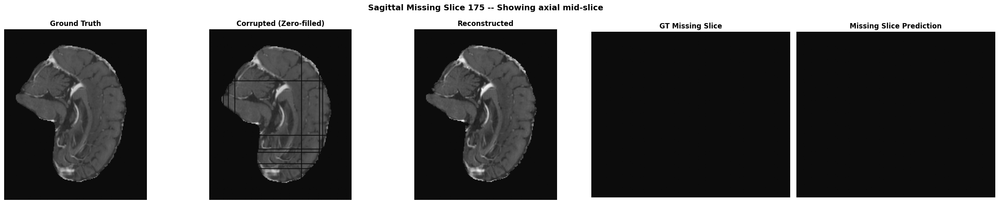

Saved: assets/plot_sagittal_175_view_coronal.png


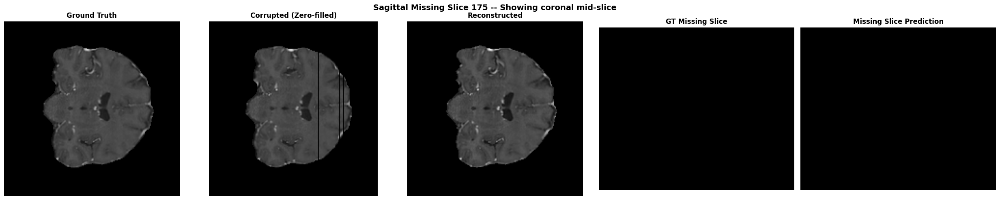

In [6]:
plot_comparison(gt, corrupted, reconstructed, missing_dict)

<span style="color: #748097; font-family: times new roman; font-size: 3em;">Metrics Calculation</span>

In [7]:
def gaussian_kernel_3d(size, sigma):
    coords = torch.arange(size) - size // 2
    g = torch.exp(-(coords**2) / (2 * sigma**2))
    g3 = g[:,None,None] * g[None,:,None] * g[None,None,:]
    g3 = g3 / g3.sum()
    return g3

def to_uint8_slices(v):
    v = (v - v.min()) / (v.max() - v.min() + 1e-8)
    v = (v * 255).clamp(0,255).byte()
    out = []
    v = v.cpu()
    if v.ndim == 5:
        v = v.squeeze(0).squeeze(0)
    for i in range(v.shape[0]):
        s = v[i]
        s = s.unsqueeze(0).repeat(3,1,1).float()
        s = torch.nn.functional.interpolate(s.unsqueeze(0), size=(299,299), mode="bilinear", align_corners=False)
        out.append(s.squeeze(0).byte())
    return torch.stack(out)

def ssim3d(x, y, C1=0.01**2, C2=0.03**2):
    k = gaussian_kernel_3d(7, 1.5).to(x.device, dtype=x.dtype).unsqueeze(0).unsqueeze(0)
    mu_x = torch.nn.functional.conv3d(x, k, padding=3)
    mu_y = torch.nn.functional.conv3d(y, k, padding=3)
    sigma_x = torch.nn.functional.conv3d(x*x, k, padding=3) - mu_x*mu_x
    sigma_y = torch.nn.functional.conv3d(y*y, k, padding=3) - mu_y*mu_y
    sigma_xy = torch.nn.functional.conv3d(x*y, k, padding=3) - mu_x*mu_y
    ssim_map = ((2*mu_x*mu_y + C1)*(2*sigma_xy + C2)) / ((mu_x*mu_x + mu_y*mu_y + C1)*(sigma_x + sigma_y + C2))
    return ssim_map.mean().item()


def psnr3d(x, y, max_val=1.0):
    mse = torch.mean((x - y)**2)
    return 10 * torch.log10(max_val**2 / mse).item()

device = "cuda" if torch.cuda.is_available() else "cpu"

gt_tensor = torch.from_numpy(gt).unsqueeze(0).unsqueeze(0)
rec_tensor = torch.from_numpy(reconstructed).unsqueeze(0).unsqueeze(0)

vmin = min(gt_tensor.min().item(), rec_tensor.min().item())
vmax = max(gt_tensor.max().item(), rec_tensor.max().item())
gt_tensor = (gt_tensor - vmin) / (vmax - vmin + 1e-8)
rec_tensor = (rec_tensor - vmin) / (vmax - vmin + 1e-8)

fid = FrechetInceptionDistance(feature=2048)

gt_slices = to_uint8_slices(gt_tensor)
rec_slices = to_uint8_slices(rec_tensor)

fid.update(gt_slices, real=True)
fid.update(rec_slices, real=False)

print("PSNR:", psnr3d(gt_tensor, rec_tensor))
print("SSIM:", ssim3d(gt_tensor, rec_tensor))
print("FID:", fid.compute().item())

PSNR: 42.91966941662588
SSIM: 0.9951684739626872
FID: 19.984872817993164


<span style="color: #748097; font-family: times new roman; font-size: 3em;">GIF Visualization</span>

In [8]:
v = reconstructed
v = (v - v.min()) / (v.max() - v.min())
v = (v * 255).astype(np.uint8)

H, W, D = v.shape
frames = []

for i in range(D):
    axial = v[:, :, i]
    coronal = v[:, i, :]
    sagittal = v[i, :, :]

    axial = cv2.resize(axial, (256, 256))
    coronal = cv2.resize(coronal, (256, 256))
    sagittal = cv2.resize(sagittal, (256, 256))

    combined = np.hstack([
        sagittal,
        coronal,
        axial
    ])

    combined = cv2.cvtColor(combined, cv2.COLOR_GRAY2RGB)
    frames.append(combined)

imageio.mimsave("assets/mri_3_view.gif", frames, fps=18, loop = 0)